In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys

module_path = os.path.abspath(os.path.join("../eeft"))
sys.path.insert(0, module_path)

In [2]:
import ee

import geemap

ee.Initialize()

## Create the Time Series

In [9]:
import data
import funcs
import harm
import ts



In [31]:
# Define the region on which to isolate the images
roi = ee.Geometry.Point([-122.02331933139578, 54.618262087662735])

s2_toa_cfg = data.Sentinel2TOA(
    ROI = roi
)
hcfg = harm.HarmonicCFG(harmonics=3)


s2_toa_cfg.START_Y = 2019
s2_toa_cfg.END_Y = 2020


In [32]:
# Define the region on which to isolate the images
input_col = ts.TimeSeries(data=s2_toa_cfg, hcfg=hcfg)
input_col

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor


## Fourier Transform

In [33]:
model = harm.HarmonicModel(
    col=input_col,
    cfg=hcfg
)

fitted = model.fit_harmonics()

fitted = fitted.map(funcs.add_phase_image(
    mode=1
))
fitted

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor


## Generate Samples

In [34]:
def new_collection_to_image(collection: ee.ImageCollection):
    stack = ee.Image(collection.iterate(lambda img, prev: ee.Image(prev).addBands(img), ee.Image(1)))
    stack = stack.select(ee.List.sequence(1, stack.bandNames().size().subtract(1)))
    return stack

def create_time_band(element: ee.Image):
    date = element.date().format('YYYY-MM-dd')
    return element.set('date', date).rename(date)

In [35]:
# add date band before creating stack
fit_imgs = fitted.select(['fitted']).map(create_time_band)

col = new_collection_to_image(fit_imgs)

points = ee.FeatureCollection("users/ryangilberthamilton/BC/williston/fpca/willistonA_no_floodplain").filter('cDesc == "Bog" && rand_int == 1')
result = col.reduceRegions(**{
    'collection': points,
    'reducer': ee.Reducer.mean(),
    'scale': 10,
    'crs': ee.Projection('EPSG:4326'),
    'tileScale': 8
})

## Generate Plots

In [36]:
import re

import pandas as pd
import geopandas as gpd


In [37]:
response = result.getInfo()
gdf = gpd.GeoDataFrame.from_features(response.get('features'), crs=4326)

columns = gdf.columns.tolist()



<Axes: xlabel='date', ylabel='mean'>

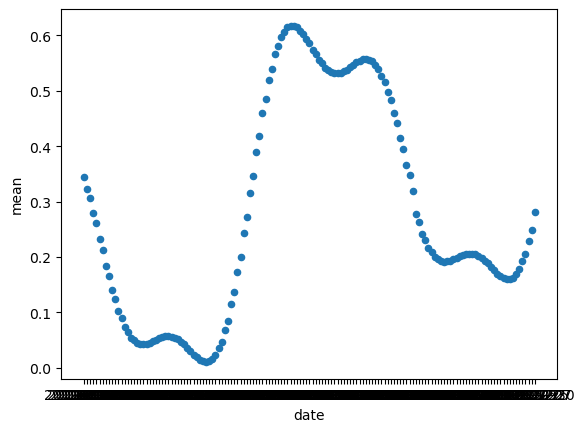

In [38]:
pattern = r"^[0-9]{4}-[0-9]{1,2}-[0-9]{1,2}$"
dates = [element for element in columns if re.match(pattern, element)]

df = gdf[dates].T

df['mean'] = df.mean(axis=1)
df['mean']
df['date'] = df.index
df
df.plot.scatter(x='date', y='mean')